## Calibrating and stitching hyperspectral scans
This notebook can be used to process and stitch hyperspectral scans as formatted for the painting dataset published by Ruben Wiersma. It expects .dat and .hdr files for each hyperspectral scan and an RGB image of the full painting to register each part to.

In [ ]:
import os
import yaml
from pathlib import Path

# TODO: update this path to the location of the dataset on your system
dataset_path = Path('/local/home/rwiersma/Documents/Paintings/Captures paintings 2023')

# Read the overview file that lists all paintings and their corresponding capture files
with (dataset_path / 'painting_measurements/paintings.yaml').open() as file:
    paintings = yaml.load(file, Loader=yaml.FullLoader)

# Print the names of the paintings and the number of captures for each painting
for key in paintings.keys():
    num_captures = len(paintings[key]['reference'])
    print(f'{key} ({num_captures} captures)')

# Make sure that JAX does not over-allocate memory, so we can use deep-learned feature descriptors
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

deheem_grapes_detail0 (1 captures)
deheem_grapes_detail1 (1 captures)
vermeer_girl_details0 (1 captures)
vermeer_girl_details1 (1 captures)
ruysch_bloemstilleven (6 captures)
hoogstraten_brievenbord (4 captures)
vermeer_girl (4 captures)
steen_piskijker (4 captures)
vermeer_melkmeisje (4 captures)


## Stitching

INFO:2025-02-13 14:18:47,884:jax._src.xla_bridge:945: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:jax._src.xla_bridge:Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:2025-02-13 14:18:47,885:jax._src.xla_bridge:945: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
INFO:jax._src.xla_bridge:Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Stitching deheem_grapes_detail0 with 1 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/deheem_grapes_detail0.png...


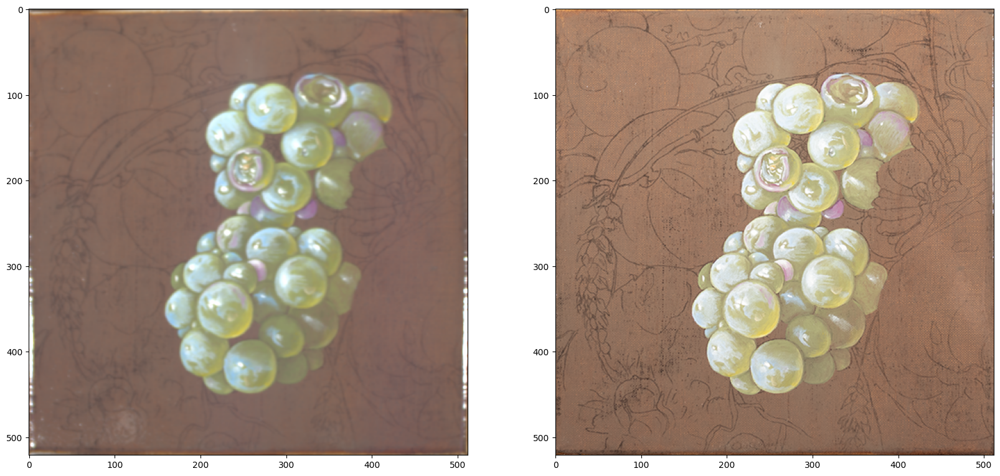

Stitching deheem_grapes_detail1 with 1 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/deheem_grapes_detail1.png...


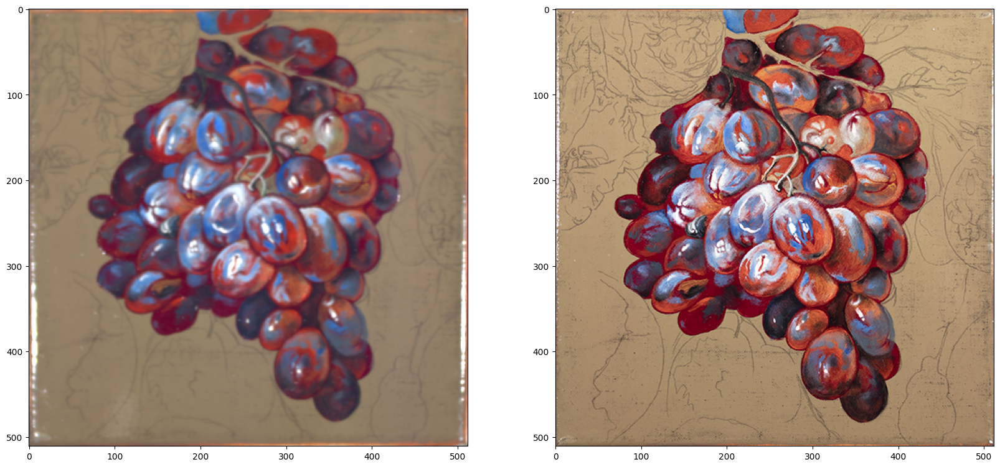

Stitching vermeer_girl_details0 with 1 captures...


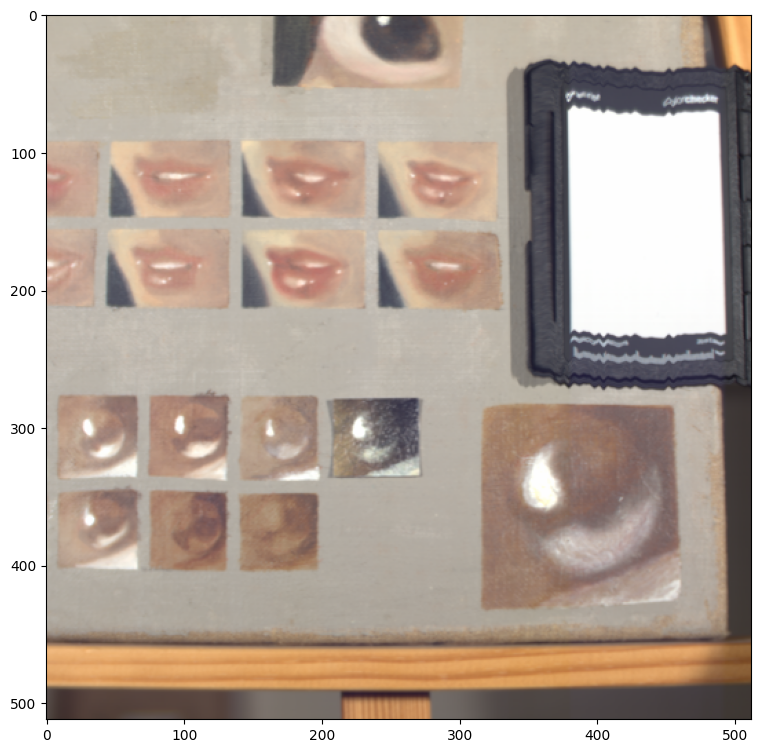

Stitching vermeer_girl_details1 with 1 captures...


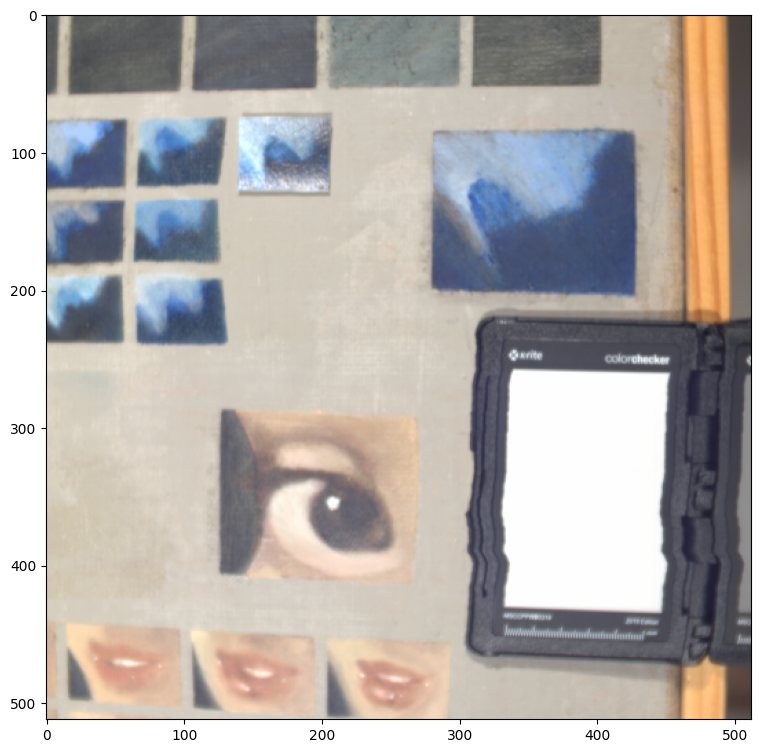

Stitching ruysch_bloemstilleven with 6 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/ruysch_bloemstilleven.png...


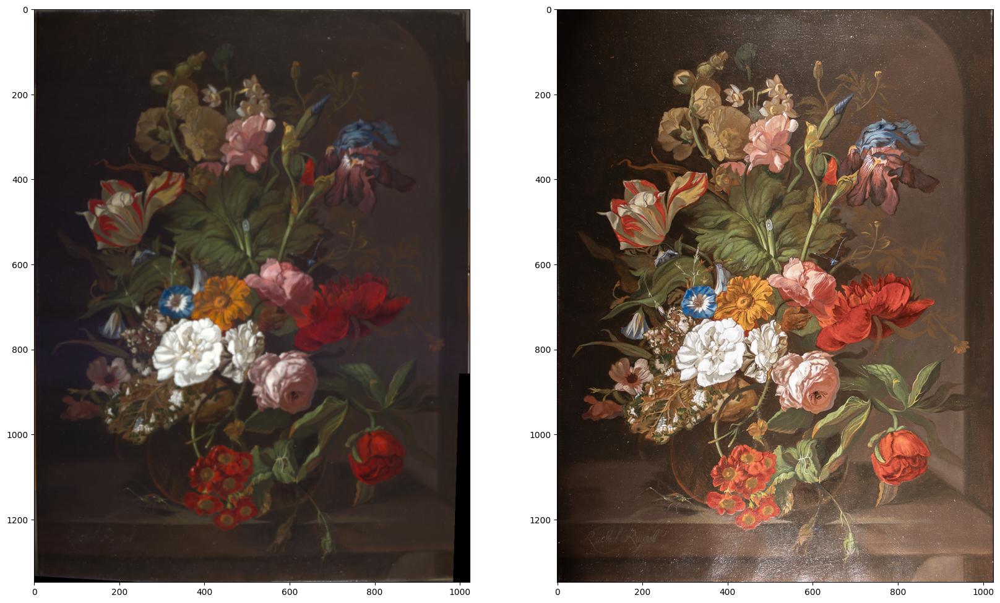

Stitching hoogstraten_brievenbord with 4 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/hoogstraten_brievenbord.png...


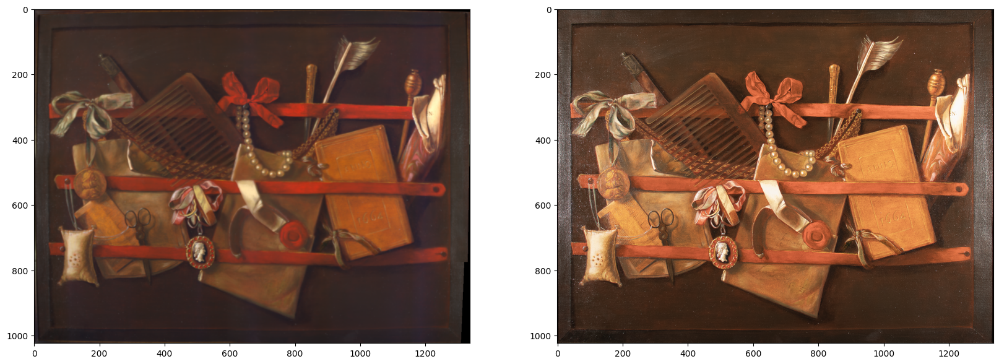

Stitching vermeer_girl with 4 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/vermeer_girl.png...


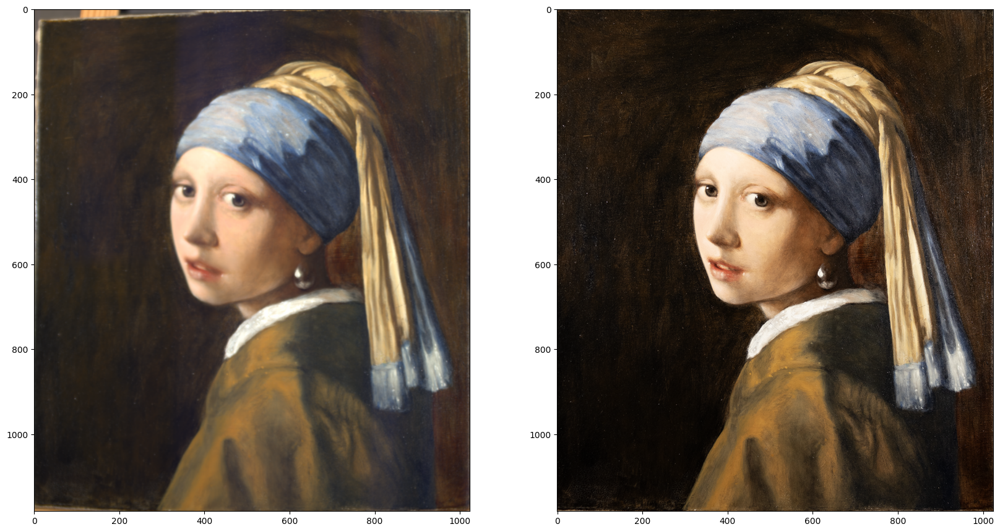

Stitching steen_piskijker with 4 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/steen_piskijker.png...


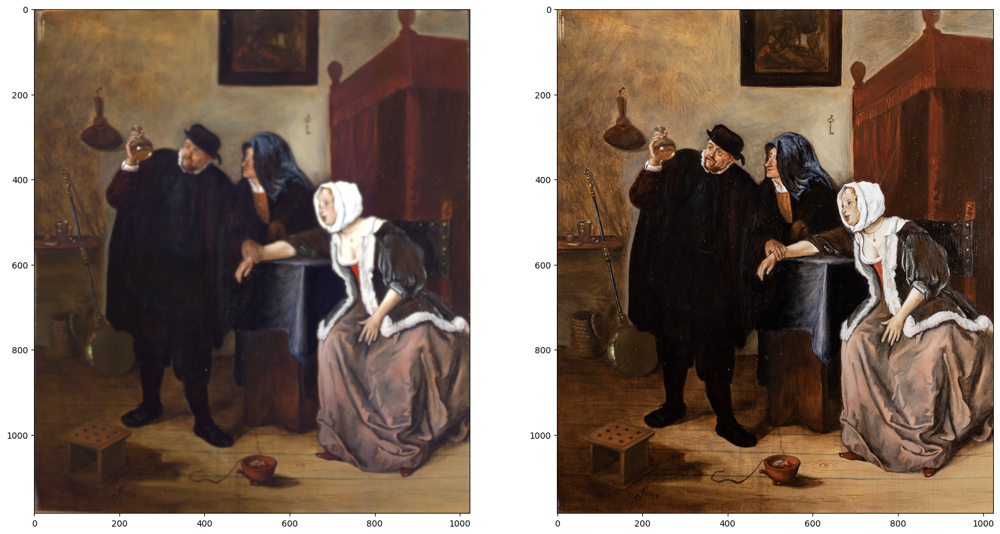

Stitching vermeer_melkmeisje with 4 captures...
Using template image /local/home/rwiersma/Documents/Paintings/Captures paintings 2023/painting_measurements/cropped/vermeer_melkmeisje.png...


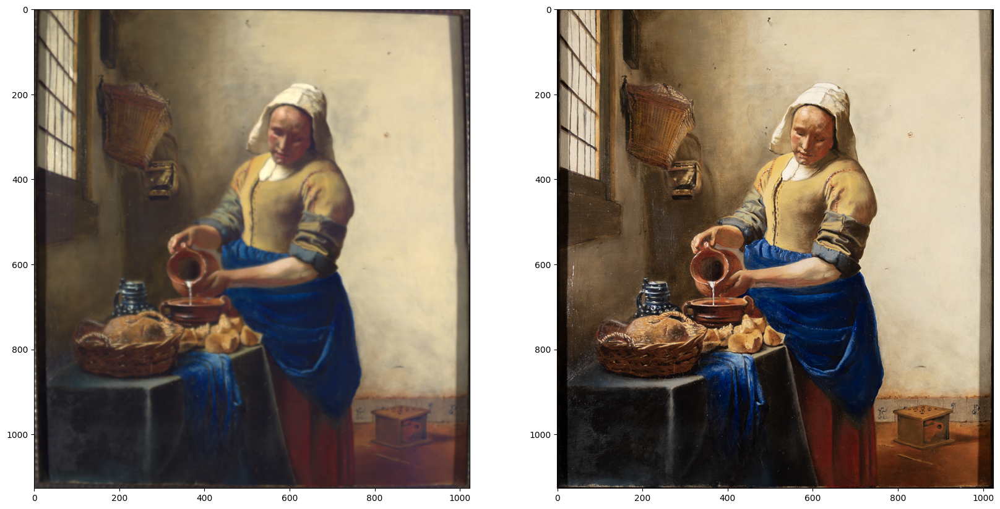

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import spectral.io.envi as envi

from painting_tools.util.color import spectral_to_rgb
from painting_tools.io import read_and_calibrate
from painting_tools.util.registration import sift_homography, keynet_hardnet_homography, grid_blend_mask


# Set stitching parameters
feature_type = 'keynet_hardnet'
threshold = 0.7
mask_overlap = 0.05
mask_margin = 0.01

# Stitch every painting in the dataset
for i in range(len(paintings.keys())):
    # Select a painting
    key = list(paintings.keys())[i]
    painting = paintings[key]
    raw, reference = painting['raw'], painting['reference']

    # Get the number of rows and columns used to capture the painting
    n_captures = len(reference)

    print(f'Stitching {key} with {n_captures} captures...')
    template_path = dataset_path / 'painting_measurements' / 'cropped' / f'{key}.png'

    if template_path.exists():
        print(f'Using template image {template_path}...')
        template = cv2.imread(str(template_path))
        template = cv2.cvtColor(template, cv2.COLOR_BGR2RGB)

    reflectance_full = None
    mask_full = None
    for capture_index in range(n_captures):
        reflectance, metadata = read_and_calibrate(raw[capture_index] if raw else None, reference[capture_index], dataset_path / 'painting_measurements', painting['rot90'] if 'rot90' in painting else 0)
        wavelengths = np.array(metadata['wavelength'], dtype=np.float32)

        # To warp the hyperspectral image to the template image,
        # we need to convert the hyperspectral image to RGB.

        # We convert to RGB, including gamma correction
        reflectance_rgb = (np.array(spectral_to_rgb(reflectance, wavelengths, apply_gamma=True, gamma=2.2)) * 255).astype(np.uint8)

        # Warp the hyperspectral image to the template image
        mask = grid_blend_mask(reflectance.shape[0], overlap=mask_overlap, margin=mask_margin)[..., None]
        if template_path.exists():
            # Compute homography using SIFT
            if feature_type == 'keynet_hardnet':
                M = keynet_hardnet_homography(template.mean(axis=-1).astype(np.float32) / 255, reflectance_rgb.mean(axis=-1).astype(np.float32) / 255, threshold=threshold)
            else:
                M = sift_homography(template, reflectance_rgb, threshold=threshold)
            # Warp the hyperspectral image to the template image
            reflectance = cv2.warpPerspective(reflectance, M, (template.shape[1], template.shape[0]))
            mask = cv2.warpPerspective(mask, M, (template.shape[1], template.shape[0]))[..., None]

        # Correct exposure in overlap region
        if reflectance_full is not None:
            overlap = mask_full * mask > 0
            reflectance = reflectance / np.mean(reflectance[overlap.squeeze()]) * np.mean(reflectance_full[overlap.squeeze()])
            mask = overlap * mask + (1 - overlap) * (mask > 0)
        
        reflectance_full = reflectance if reflectance_full is None else (1 - mask) * reflectance_full + mask * reflectance
        mask_full = mask if mask_full is None else (mask_full + mask).clip(0, 1)

    # Convert stitched image to RGB
    reflectance_full_rgb = (np.array(spectral_to_rgb(reflectance_full, wavelengths, apply_gamma=True, gamma=2.2)) * 255).astype(np.uint8)

    # Save the warped hyperspectral image to a file
    save_path = dataset_path / 'processed' / key
    if not save_path.exists():
        save_path.mkdir(parents=True)
    envi.save_image(str(save_path / f'reflectance_{key}.hdr'), reflectance_full, ext='dat', interleave='bil', force=True, metadata=metadata)
    cv2.imwrite(str(save_path / f'reflectance_{key}.png'), cv2.cvtColor(reflectance_full_rgb, cv2.COLOR_RGB2BGR))

    # Plot the warped and stitched hyperspectral image
    fig = plt.figure(figsize=(20, 20))
    ax0 = fig.add_subplot(1, 2, 1)
    ax0.imshow(reflectance_full_rgb)
    if template_path.exists():
        ax1 = fig.add_subplot(1, 2, 2)
        ax1.imshow(template)

    plt.show()